In [1]:
import os
import shutil
import warnings
warnings.filterwarnings("ignore")

In [2]:
os.makedirs('glasses', exist_ok=True)
os.makedirs('glasses/is_black', exist_ok=True)
os.makedirs('glasses/no_black', exist_ok=True)
os.makedirs('glasses/is_black/images', exist_ok=True)
os.makedirs('glasses/no_black/images', exist_ok=True)

In [3]:
data_input = '/kaggle/input/samsung-2024-cv/data'
data_work = '/kaggle/working'

In [4]:
i = 0
for dirname, _, filenames in os.walk(f'{data_input}/is_black_glasses/images'):
    for filename in filenames:
        if i < 1000:
            i += 1
            shutil.copy(os.path.join(dirname, filename), os.path.join(f'{data_work}/glasses/is_black/images',filename))
        else:
            break
    if i >= 1000:
        break
print(len(os.listdir(f'{data_work}/glasses/is_black/images')))

1000


In [5]:
i = 0
for dirname, _, filenames in os.walk(f'{data_input}/not_black_glasses/images'):
    for filename in filenames:
        if i < len(os.listdir(f'{data_work}/glasses/is_black/images')):
            i += 1
            shutil.copy(os.path.join(dirname, filename), os.path.join(f'{data_work}/glasses/no_black/images',filename))
        else:
            break
    if i >= len(os.listdir(f'{data_work}/glasses/is_black/images')):
        break
print(len(os.listdir(f'{data_work}/glasses/no_black/images')))

1000


In [6]:
os.makedirs('train', exist_ok=True)
os.makedirs('train/is_black', exist_ok=True)
os.makedirs('train/no_black', exist_ok=True)
os.makedirs('val', exist_ok=True)
os.makedirs('val/is_black', exist_ok=True)
os.makedirs('val/no_black', exist_ok=True)
os.makedirs('test', exist_ok=True)
os.makedirs('test/is_black', exist_ok=True)
os.makedirs('test/no_black', exist_ok=True)

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
from torchvision import transforms, models
from random import shuffle, seed
from tqdm import tqdm

In [8]:
transforms_1 = transforms.Compose([
    transforms.RandomRotation(degrees=(-5, 5)),
    transforms.ColorJitter(brightness=(0.75,1.25), contrast=(0.75,1.25), saturation=(0.75,1.25)),
    transforms.ToTensor()
])

transforms_2 = transforms.Compose([
    transforms.RandomRotation(degrees=(-30, 30)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor()
])

transforms_3 = transforms.Compose([
    transforms.RandomCrop(size=224),
    transforms.RandomRotation(degrees=(-5, 5)),
    transforms.ColorJitter(brightness=(0.75,1.25), contrast=(0.75,1.25), saturation=(0.75,1.25)),
    transforms.ToTensor()
])

transforms_4 = transforms.Compose([
    transforms.RandomCrop(size=224),
    transforms.RandomRotation(degrees=(-30, 30)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor()
])

dataset_1 = torchvision.datasets.ImageFolder('glasses', transforms_1)
dataset_2 = torchvision.datasets.ImageFolder('glasses', transforms_2)
dataset_3 = torchvision.datasets.ImageFolder('glasses', transforms_3)
dataset_4 = torchvision.datasets.ImageFolder('glasses', transforms_4)
dataset = torch.utils.data.ConcatDataset([dataset_1, dataset_2, dataset_3, dataset_4])
len(dataset)

8000

In [9]:
for ind, el in enumerate(dataset):
    if el[1] == 0:
        transforms.ToPILImage()(el[0]).save(f'{data_work}/train/is_black/{ind}.png')
    else:
        transforms.ToPILImage()(el[0]).save(f'{data_work}/train/no_black/{ind}.png')

In [10]:
lst_is_black = os.listdir(f'{data_work}/train/is_black')
lst_no_black = os.listdir(f'{data_work}/train/no_black')
seed(1052024)
shuffle(lst_no_black)
seed(1052024)
shuffle(lst_is_black)

# 4000 images -> 160 test, 768 validation (12 batch * 64 batch_size), 3072 train (48 batch * 64 batch_size) 
for el in lst_is_black[:160]:
    shutil.move(f'{data_work}/train/is_black/{el}', f'{data_work}/test/is_black')
for el in lst_is_black[160:928]:
    shutil.move(f'{data_work}/train/is_black/{el}', f'{data_work}/val/is_black')
for el in lst_no_black[:160]:
    shutil.move(f'{data_work}/train/no_black/{el}', f'{data_work}/test/no_black')
for el in lst_no_black[160:928]:
    shutil.move(f'{data_work}/train/no_black/{el}', f'{data_work}/val/no_black')

print(len(os.listdir(f'{data_work}/train/no_black')), 
      len(os.listdir(f'{data_work}/train/is_black')),
      len(os.listdir(f'{data_work}/val/no_black')), 
      len(os.listdir(f'{data_work}/val/is_black')),
      len(os.listdir(f'{data_work}/test/no_black')), 
      len(os.listdir(f'{data_work}/test/is_black')))

3072 3072 768 768 160 160


In [11]:
train_transforms = transforms.Compose([
    transforms.Resize((380, 380)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize((380, 380)),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

train_dataset = torchvision.datasets.ImageFolder(f'{data_work}/train', train_transforms)
val_dataset = torchvision.datasets.ImageFolder(f'{data_work}/val', val_transforms)

batch_size = 64
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True, num_workers=batch_size)
val_dataloader = torch.utils.data.DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False, num_workers=batch_size)

len(train_dataloader), len(train_dataset)

(96, 6144)

In [12]:
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])
class_names = {0: 'is_black', 1: 'no_black'}

def show_input(input_tensor, title=''):
    image = input_tensor.permute(1, 2, 0).numpy()
    image = std * image + mean
    plt.imshow(image.clip(0, 1))
    plt.title(title)
    plt.show()
    plt.pause(0.001)

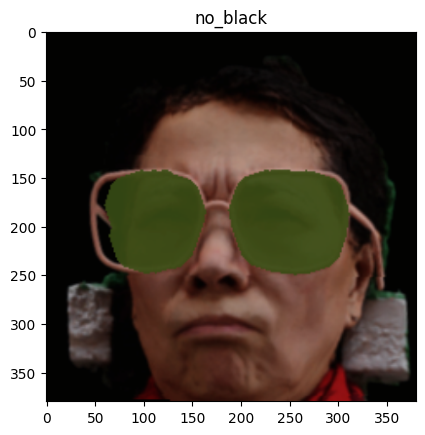

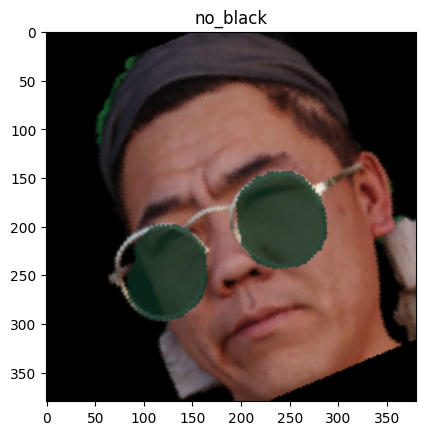

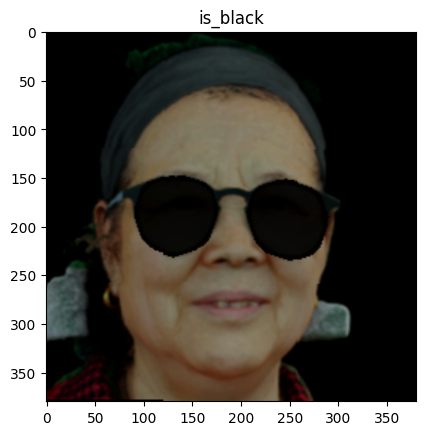

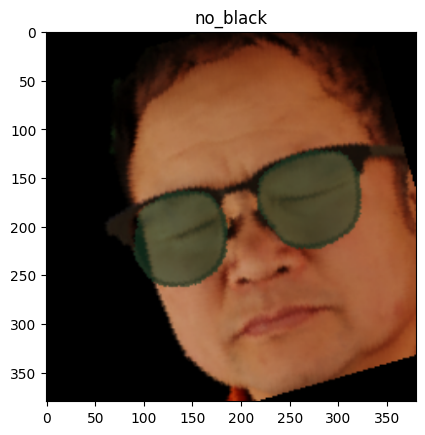

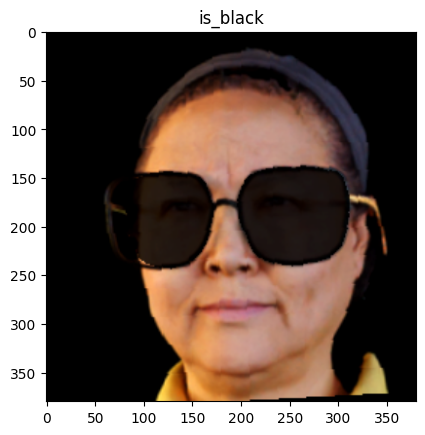

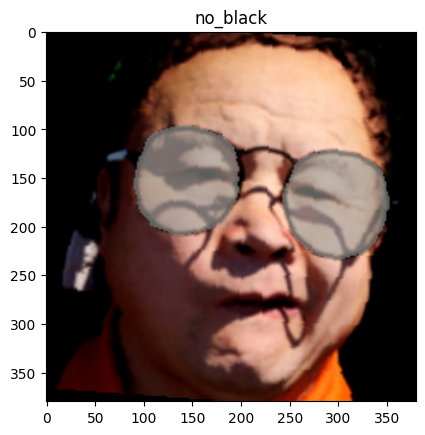

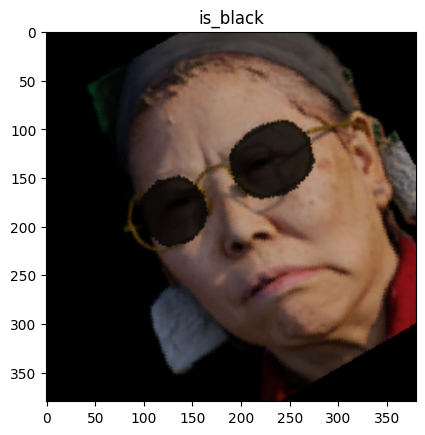

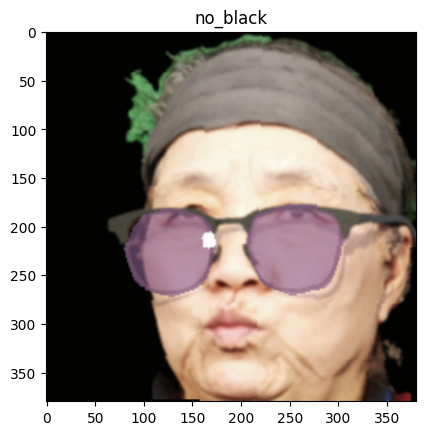

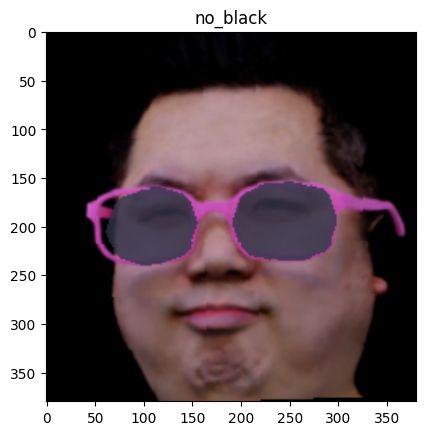

In [13]:
# show images from train dataset
X_batch, y_batch = next(iter(train_dataloader))
i = 0
for x_item, y_item in zip(X_batch, y_batch):
    i += 1
    if i == 10:
        break
    show_input(x_item, title=class_names.get(int(y_item)))

In [14]:
def train_model(model, loss, optimizer, scheduler, num_epochs):
    for epoch in range(num_epochs):
        print('Epoch {}/{}:'.format(epoch, num_epochs - 1), flush=True)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                dataloader = train_dataloader
                model.train()  # Set model to training mode
            else:
                dataloader = val_dataloader
                model.eval()   # Set model to evaluate mode

            running_loss = 0.
            running_acc = 0.  
            
            # Iterate over data.
            for inputs, labels in tqdm(dataloader):
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                # forward and backward
                with torch.set_grad_enabled(phase == 'train'):
                    preds = model(inputs)
                    loss_value = loss(preds, labels)
                    preds_class = preds.argmax(dim=1)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss_value.backward()
                        optimizer.step()
                        scheduler.step(loss_value)

                # statistics
                running_loss += loss_value.item()
                running_acc += (preds_class == labels.data).float().mean()

            epoch_loss = running_loss / len(dataloader)
            epoch_acc = running_acc / len(dataloader)

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc), flush=True)

    return model

In [15]:
# Download EfficientNet-b4 from TorchHub with pretrained weigths on ImagNet dataset
model = models.efficientnet_b4(pretrained=True)

Downloading: "https://download.pytorch.org/models/efficientnet_b4_rwightman-23ab8bcd.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b4_rwightman-23ab8bcd.pth
100%|██████████| 74.5M/74.5M [00:01<00:00, 76.3MB/s]


In [16]:
# freeze all layers
for param in model.parameters():
    param.requires_grad = False

# unfreeze 7 and 8 blocks
for i in range(7, 9):
    for param in model.features[i].parameters():
        param.requires_grad = True
        
# change last full-connected layer (only two classes)
model.classifier[1] = torch.nn.Linear(model.classifier[1].in_features, 2)

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

loss = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1.0e-3)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer)

In [17]:
train_model(model, loss, optimizer, scheduler, num_epochs=10)

Epoch 0/9:


100%|██████████| 96/96 [01:12<00:00,  1.33it/s]

train Loss: 0.2498 Acc: 0.8963



100%|██████████| 24/24 [00:16<00:00,  1.48it/s]

val Loss: 0.1031 Acc: 0.9655
Epoch 1/9:



100%|██████████| 96/96 [01:07<00:00,  1.41it/s]

train Loss: 0.1377 Acc: 0.9536



100%|██████████| 24/24 [00:15<00:00,  1.51it/s]

val Loss: 0.1046 Acc: 0.9629
Epoch 2/9:



100%|██████████| 96/96 [01:07<00:00,  1.42it/s]

train Loss: 0.1334 Acc: 0.9556



100%|██████████| 24/24 [00:16<00:00,  1.48it/s]

val Loss: 0.1044 Acc: 0.9635
Epoch 3/9:



100%|██████████| 96/96 [01:07<00:00,  1.42it/s]

train Loss: 0.1380 Acc: 0.9562



100%|██████████| 24/24 [00:16<00:00,  1.48it/s]

val Loss: 0.1025 Acc: 0.9635
Epoch 4/9:



100%|██████████| 96/96 [01:08<00:00,  1.41it/s]

train Loss: 0.1422 Acc: 0.9539



100%|██████████| 24/24 [00:16<00:00,  1.43it/s]

val Loss: 0.1002 Acc: 0.9642
Epoch 5/9:



100%|██████████| 96/96 [01:07<00:00,  1.42it/s]

train Loss: 0.1418 Acc: 0.9531



100%|██████████| 24/24 [00:16<00:00,  1.48it/s]

val Loss: 0.1006 Acc: 0.9635
Epoch 6/9:



100%|██████████| 96/96 [01:07<00:00,  1.42it/s]

train Loss: 0.1301 Acc: 0.9613



100%|██████████| 24/24 [00:16<00:00,  1.50it/s]

val Loss: 0.1009 Acc: 0.9655
Epoch 7/9:



100%|██████████| 96/96 [01:07<00:00,  1.42it/s]

train Loss: 0.1410 Acc: 0.9575



100%|██████████| 24/24 [00:16<00:00,  1.45it/s]

val Loss: 0.1018 Acc: 0.9642
Epoch 8/9:



100%|██████████| 96/96 [01:07<00:00,  1.42it/s]

train Loss: 0.1352 Acc: 0.9580



100%|██████████| 24/24 [00:15<00:00,  1.51it/s]

val Loss: 0.1021 Acc: 0.9648
Epoch 9/9:



100%|██████████| 96/96 [01:08<00:00,  1.41it/s]

train Loss: 0.1334 Acc: 0.9561



100%|██████████| 24/24 [00:16<00:00,  1.50it/s]

val Loss: 0.1031 Acc: 0.9642


EfficientNet(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 48, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): SiLU(inplace=True)
    )
    (1): Sequential(
      (0): MBConv(
        (block): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(48, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=48, bias=False)
            (1): BatchNorm2d(48, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): SiLU(inplace=True)
          )
          (1): SqueezeExcitation(
            (avgpool): AdaptiveAvgPool2d(output_size=1)
            (fc1): Conv2d(48, 12, kernel_size=(1, 1), stride=(1, 1))
            (fc2): Conv2d(12, 48, kernel_size=(1, 1), stride=(1, 1))
            (activation): SiLU(inplace=True)
            (scale_activation): Sigmoid()
          )
          (2): Conv2dNormActiv

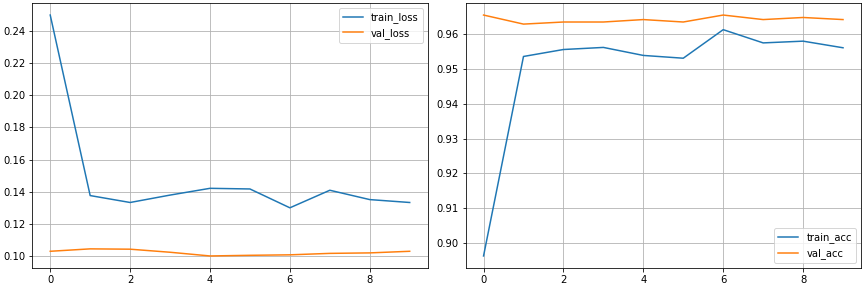

In [18]:
import subprocess
from IPython.display import FileLink, display

def download_file(path, download_file_name):
    os.chdir(f'{data_work}/')
    zip_name = f'{data_work}/{download_file_name}.zip'
    command = f'zip {zip_name} {path} -r'
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode != 0:
        print("Unable to run zip command!")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [19]:
os.makedirs('save_model', exist_ok=True)
torch.save(model, f'{data_work}/save_model/model_effic4_layers2_transforms4')
download_file(f'{data_work}/save_model/model_effic4_layers2_transforms4', 'model_effic4_layers2_transforms4')

/kaggle/working/model_effic4_layers2_transforms4.zip

In [20]:
class ImageFolderWithPaths(torchvision.datasets.ImageFolder):
    def __getitem__(self, index):
        original_tuple = super(ImageFolderWithPaths, self).__getitem__(index)
        path = self.imgs[index][0]
        tuple_with_path = (original_tuple + (path,))
        return tuple_with_path
    
test_dataset = ImageFolderWithPaths(f'{data_work}/test', val_transforms)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=batch_size, shuffle=False, num_workers=0)

In [21]:
model.eval()

test_predictions = []
test_img_paths = []
for inputs, labels, paths in tqdm(test_dataloader):
    inputs = inputs.to(device)
    labels = labels.to(device)
    with torch.set_grad_enabled(False):
        preds = model(inputs)
    test_predictions.append(
        torch.nn.functional.softmax(preds, dim=1)[:,1].data.cpu().numpy())
    test_img_paths.extend(paths)
    
test_predictions = np.concatenate(test_predictions)

len(np.where(test_predictions[:160] < 0.5)[0]) / 160, len(np.where(test_predictions[160:] > 0.5)[0]) / 160

100%|██████████| 5/5 [00:03<00:00,  1.32it/s]


(0.99375, 0.9625)

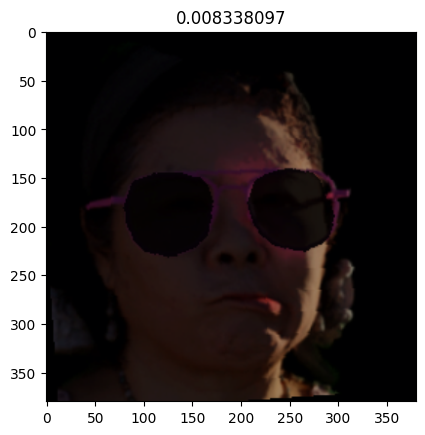

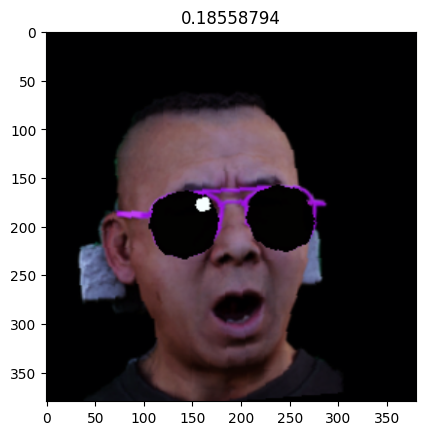

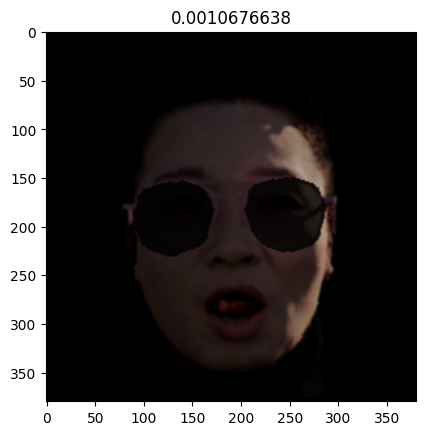

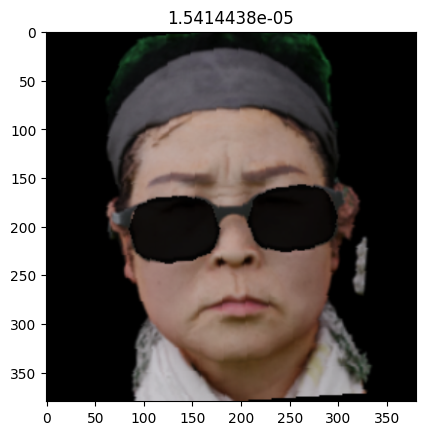

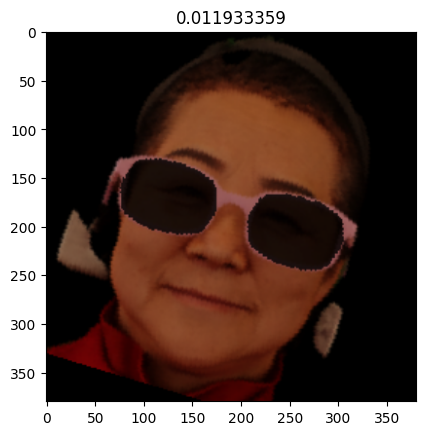

...

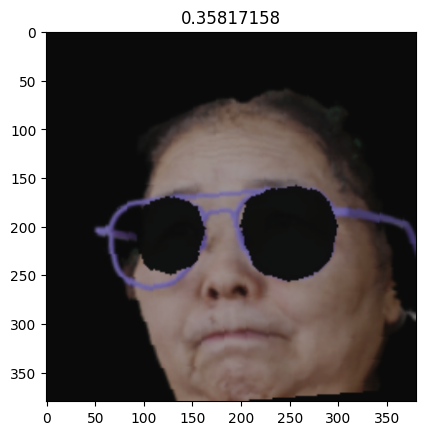

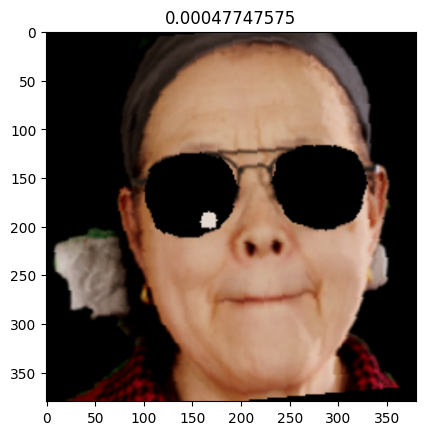

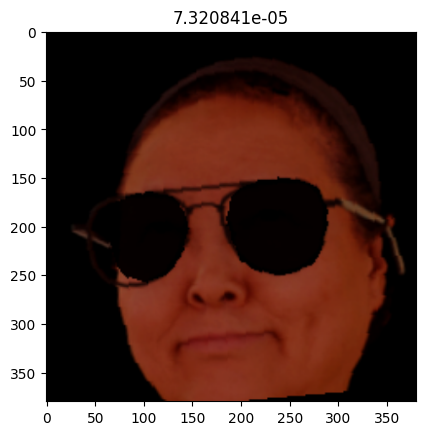

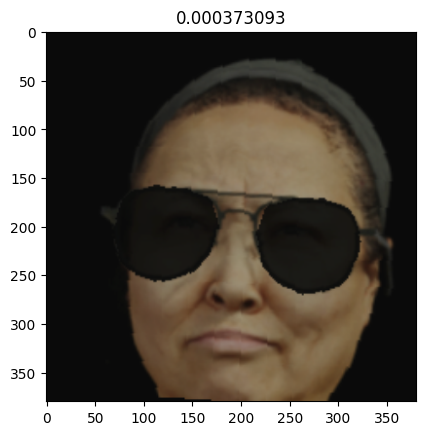

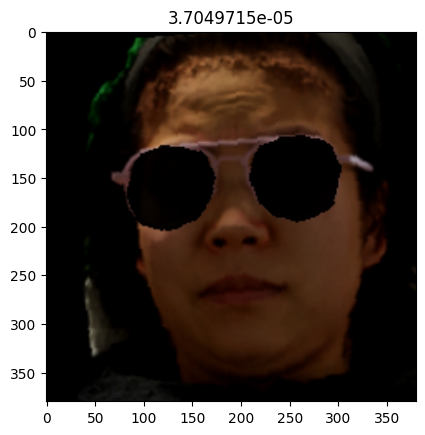

In [22]:
# show images from test dataset with prediction
inputs, labels, paths = next(iter(test_dataloader))
for img, pred in zip(inputs, test_predictions):
    show_input(img, title=pred)